In [4]:

from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.optimizers import SGD,RMSprop,Adam
from keras.utils import np_utils

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os

from PIL import Image
from numpy import *

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from skimage import color
from skimage import io
import pickle




img_rows, img_cols = 300, 300



path1 = "D:\Image_sentiment_Analysis_arsh\Agg_AMT_Candidates"

path2 = "D:\Image_sentiment_Analysis_arsh\color_image_resized"




listing = os.listdir(path1) 
num_samples=size(listing)
print('number of original samples', num_samples)

for file in listing:
    im = Image.open(path1 + '//' + file)   
    img = im.resize((img_rows,img_cols))
    rgb_img = img.convert('RGB')         
    rgb_img.save(path2 +'//' +  file)
  


imlist = os.listdir(path2)
resize_samples=size(imlist)
print('number of resized samples', resize_samples)


ground_truth = 'data.txt'
instanceList = []
sentiment = []
name = []
label = np.empty(0, dtype=object)

gt_file = open(ground_truth, "r")

# Store images in a list
while (True):
    line = gt_file.readline()
    # Check if we have reached the end
    if (len(line) == 0):
        break
    # Add the line to the list
    instanceList.append(line)

for instance in instanceList:
  values = instance.split()
  name.append(values[0])
  sentiment.append(int(values[1]))
  
label = np.array(sentiment)
immatrix = array([array(Image.open(path2 + '//'+ im2)).flatten() for im2 in name],'f')

data,Label = shuffle(immatrix,label, random_state=2)
train_data = [data,Label]
train_data[0]= train_data[0].reshape(train_data[0].shape[0],img_rows, img_cols, 3)

print (train_data[0].shape)
print (train_data[1].shape)



number of original samples 10387
number of resized samples 10387
(10387, 300, 300, 3)
(10387,)


In [3]:
with open('train_data.pickle', 'wb') as handle:
    pickle.dump(train_data, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print('pickle file saved successfully')

pickle file saved successfully


In [4]:
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.optimizers import SGD,RMSprop,Adam
from keras.utils import np_utils

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from PIL import Image
from numpy import *
import pickle
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

img_rows, img_cols = 300, 300
img_channels = 3

batch_size = 16
nb_classes = 2
nb_epoch = 10

nb_filters = 64
nb_pool = 2
nb_conv = 4



import pickle   
with open('train_data.pickle', 'rb') as handle:
    train_data = pickle.load(handle)

(X, y) = (train_data[0],train_data[1])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4)


X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

X_train /= 255
X_test /= 255

print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')


model = Sequential()

model.add(Conv2D(nb_filters, (nb_conv, nb_conv), input_shape=(img_rows, img_cols, img_channels)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten()) # Output convert into one dimension layer and will go to Dense layer
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

hist = model.fit(X_train, y_train, batch_size=batch_size, epochs=nb_epoch, verbose=1, validation_split=0.2)

score = model.evaluate(X_test, y_test, verbose=0)
print('Test accuracy:', score[1])



X_train shape: (7270, 300, 300, 3)
7270 train samples
3117 test samples
Epoch 1/10
364/364 [==============================] - 399s 1s/step - loss: 0.5406 - accuracy: 0.7859 - val_loss: 0.5360 - val_accuracy: 0.7847
Epoch 2/10
364/364 [==============================] - 395s 1s/step - loss: 0.5059 - accuracy: 0.7892 - val_loss: 0.8418 - val_accuracy: 0.7847
Epoch 3/10
364/364 [==============================] - 390s 1s/step - loss: 0.4975 - accuracy: 0.7895 - val_loss: 0.4726 - val_accuracy: 0.7847
Epoch 4/10
364/364 [==============================] - 400s 1s/step - loss: 0.4915 - accuracy: 0.7895 - val_loss: 0.4876 - val_accuracy: 0.7847
Epoch 5/10
364/364 [==============================] - 407s 1s/step - loss: 0.4830 - accuracy: 0.7904 - val_loss: 0.4913 - val_accuracy: 0.7840
Epoch 6/10
364/364 [==============================] - 395s 1s/step - loss: 0.4735 - accuracy: 0.7899 - val_loss: 0.4813 - val_accuracy: 0.7847
Epoch 7/10
364/364 [==============================] - 406s 1s/step - l

In [9]:
score = model.evaluate(X_test, y_test,batch_size=batch_size, verbose=1)

print('Test accuracy:', score[1])

195/195 [==============================] - 41s 208ms/step - loss: 0.4777 - accuracy: 0.7886
Test accuracy: 0.7885787487030029


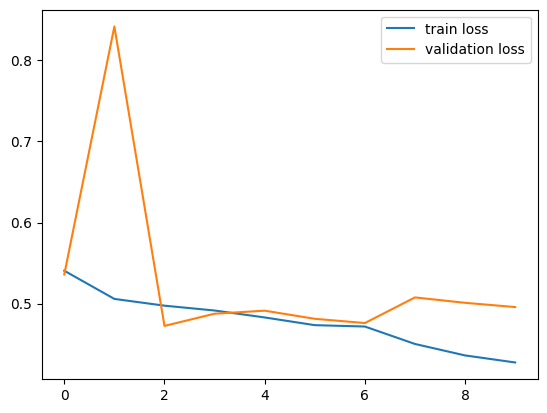

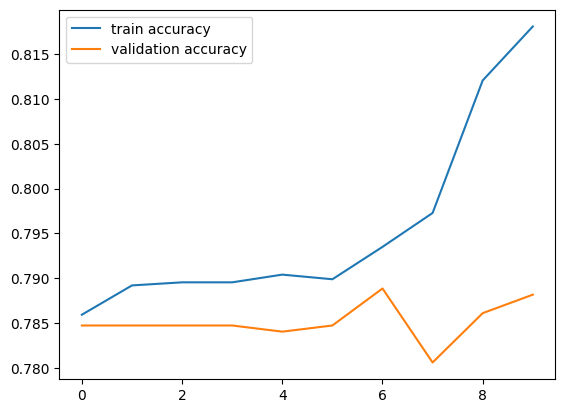

In [11]:
h=hist
plt.plot(h.history['loss'],label='train loss')
plt.plot(h.history['val_loss'],label='validation loss')
plt.legend()
plt.show()


plt.plot(h.history['accuracy'],label='train accuracy')
plt.plot(h.history['val_accuracy'],label='validation accuracy')
plt.legend()
plt.show()

In [10]:
model.save('ImageSentimentAnalysis')

INFO:tensorflow:Assets written to: ImageSentimentAnalysis\assets


INFO:tensorflow:Assets written to: ImageSentimentAnalysis\assets


1/1 [==============================] - 0s 85ms/step
Actual Value: Positive
Predicted Value: Positive


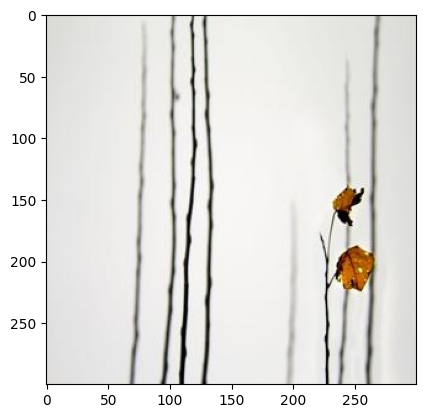




1/1 [==============================] - 0s 36ms/step
Actual Value: Positive
Predicted Value: Positive


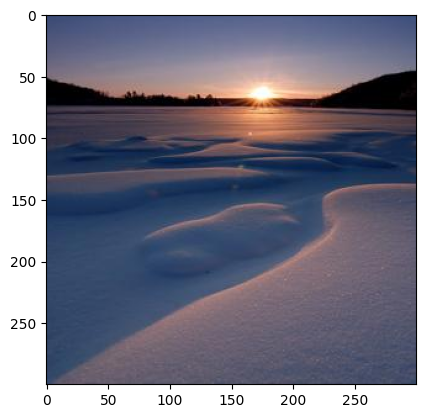




1/1 [==============================] - 0s 40ms/step
Actual Value: Positive
Predicted Value: Positive


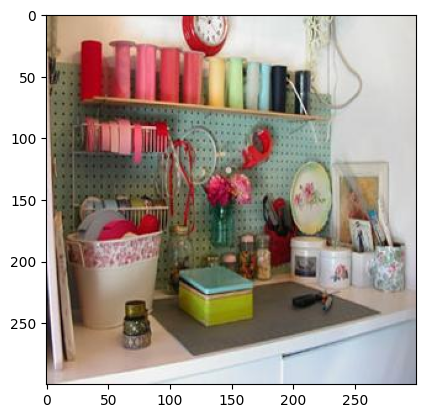




1/1 [==============================] - 0s 36ms/step
Actual Value: Positive
Predicted Value: Positive


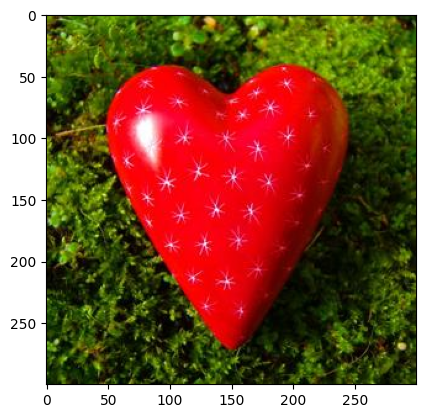




1/1 [==============================] - 0s 49ms/step
Actual Value : Negative
Predicted Value: Positive


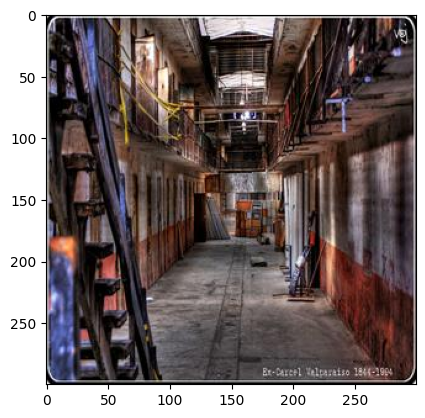




1/1 [==============================] - 0s 36ms/step
Actual Value : Negative
Predicted Value: Positive


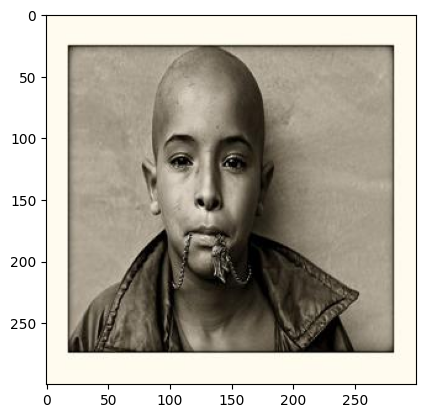




1/1 [==============================] - 0s 45ms/step
Actual Value: Positive
Predicted Value: Positive


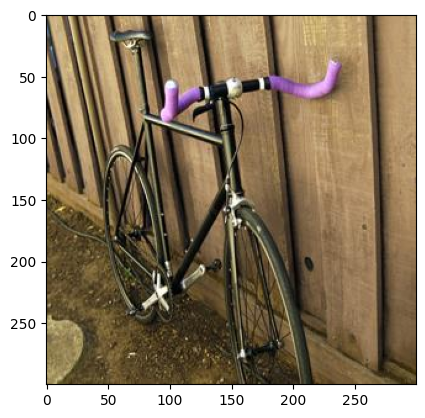




1/1 [==============================] - 0s 41ms/step
Actual Value : Negative
Predicted Value: Positive


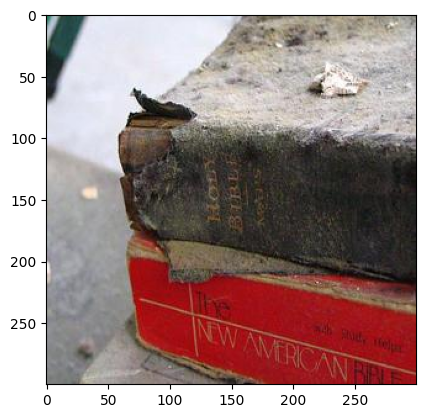




1/1 [==============================] - 0s 44ms/step
Actual Value: Positive
Predicted Value: Positive


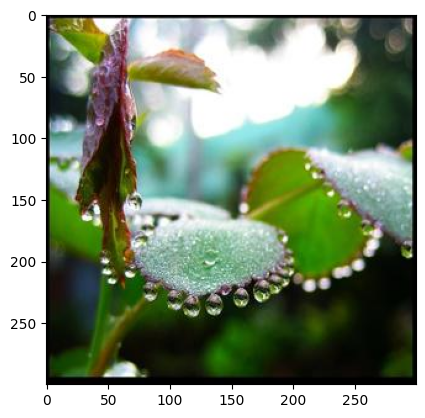




1/1 [==============================] - 0s 46ms/step
Actual Value: Positive
Predicted Value: Positive


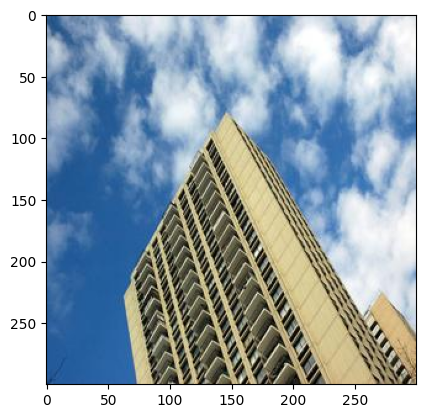




1/1 [==============================] - 0s 38ms/step
Actual Value: Positive
Predicted Value: Positive


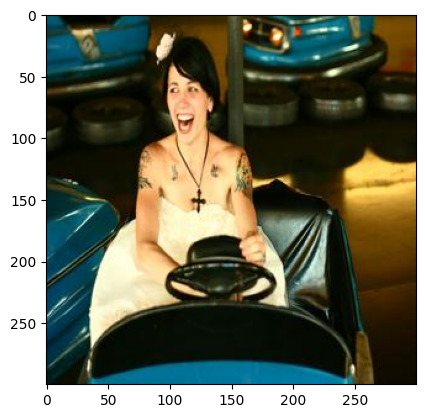




1/1 [==============================] - 0s 53ms/step
Actual Value : Negative
Predicted Value: Positive


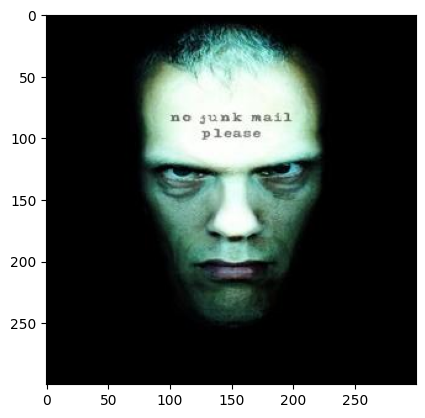




1/1 [==============================] - 0s 37ms/step
Actual Value: Positive
Predicted Value: Positive


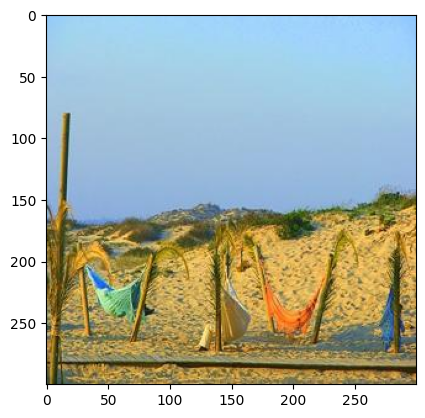




1/1 [==============================] - 0s 59ms/step
Actual Value : Negative
Predicted Value: Positive


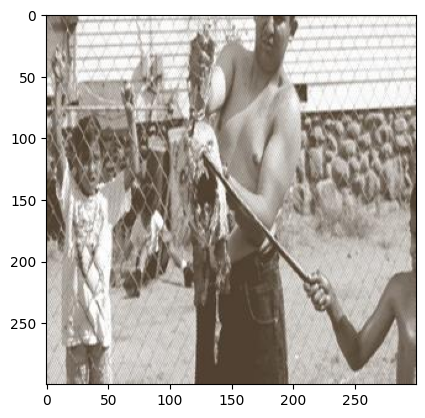




1/1 [==============================] - 0s 39ms/step
Actual Value : Negative
Predicted Value : Negative


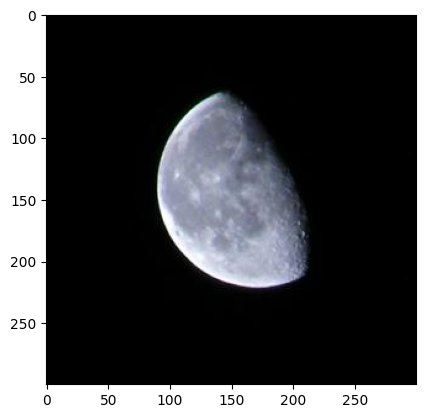




1/1 [==============================] - 0s 42ms/step
Actual Value: Positive
Predicted Value: Positive


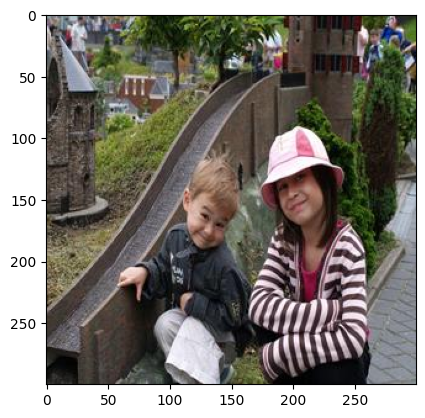




1/1 [==============================] - 0s 51ms/step
Actual Value: Positive
Predicted Value: Positive


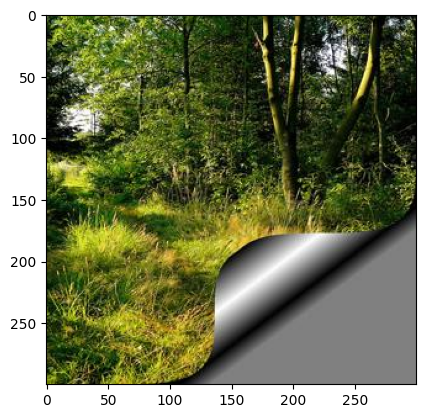




1/1 [==============================] - 0s 52ms/step
Actual Value: Positive
Predicted Value: Positive


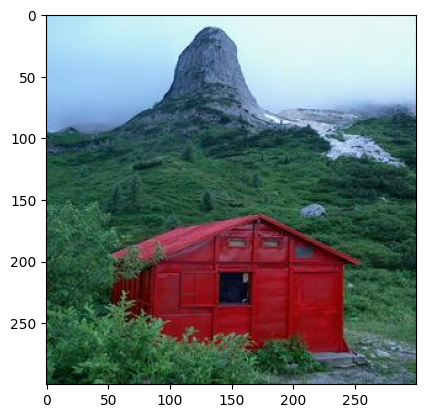




1/1 [==============================] - 0s 42ms/step
Actual Value: Positive
Predicted Value: Positive


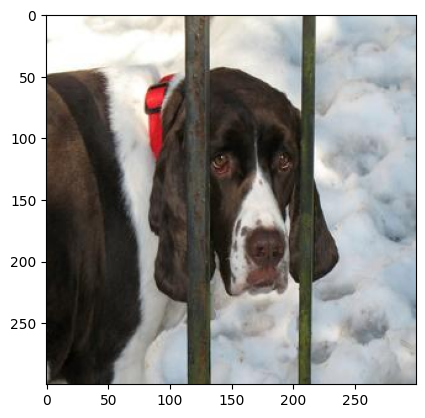




1/1 [==============================] - 0s 39ms/step
Actual Value: Positive
Predicted Value: Positive


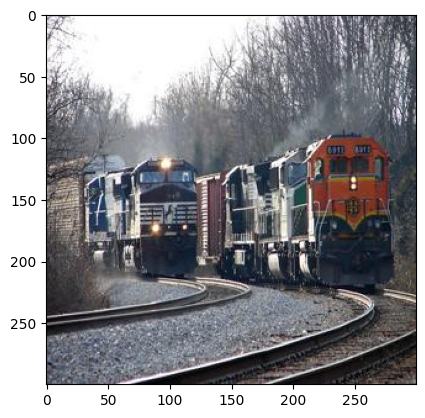




1/1 [==============================] - 0s 42ms/step
Actual Value: Positive
Predicted Value: Positive


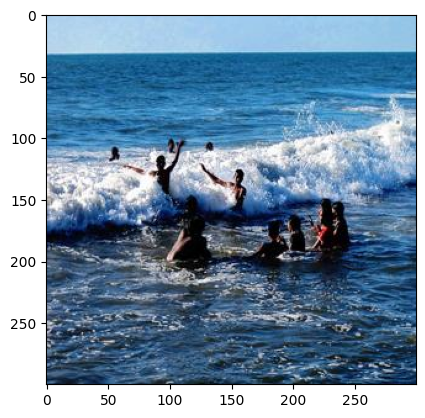




1/1 [==============================] - 0s 38ms/step
Actual Value: Positive
Predicted Value: Positive


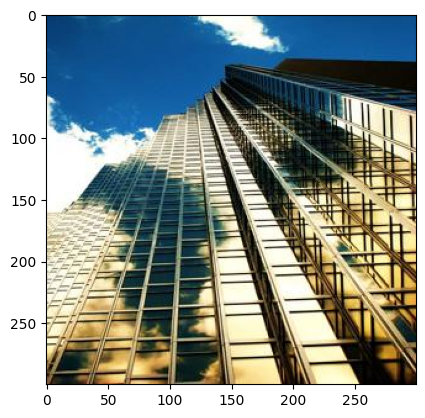




1/1 [==============================] - 0s 45ms/step
Actual Value: Positive
Predicted Value: Positive


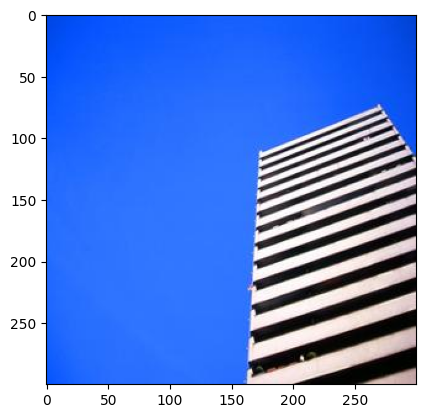




1/1 [==============================] - 0s 37ms/step
Actual Value: Positive
Predicted Value: Positive


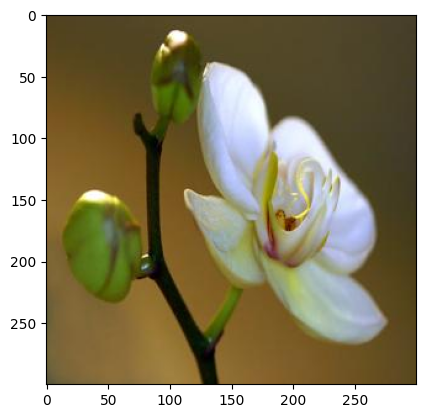




1/1 [==============================] - 0s 42ms/step
Actual Value: Positive
Predicted Value: Positive


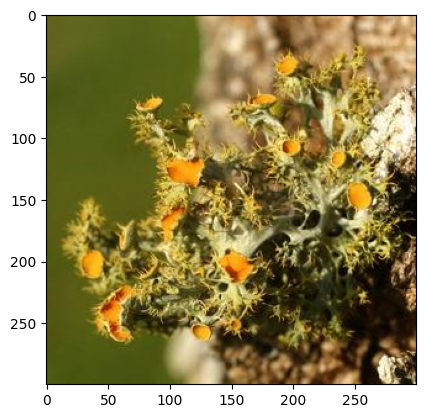




1/1 [==============================] - 0s 39ms/step
Actual Value : Negative
Predicted Value: Positive


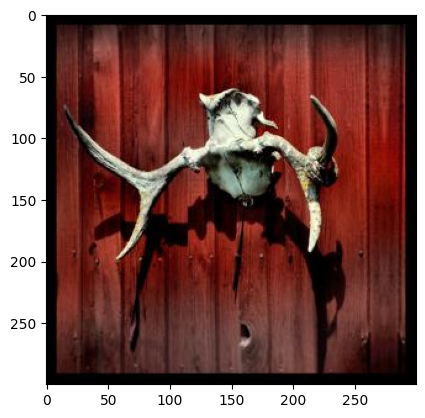




1/1 [==============================] - 0s 36ms/step
Actual Value: Positive
Predicted Value: Positive


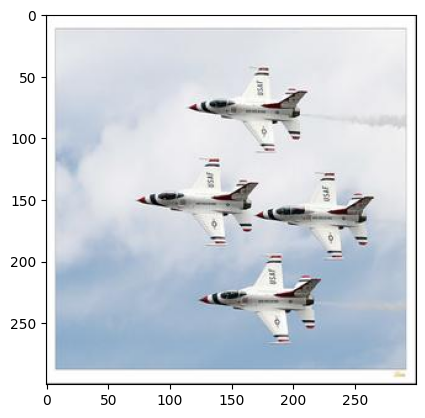




1/1 [==============================] - 0s 43ms/step
Actual Value: Positive
Predicted Value: Positive


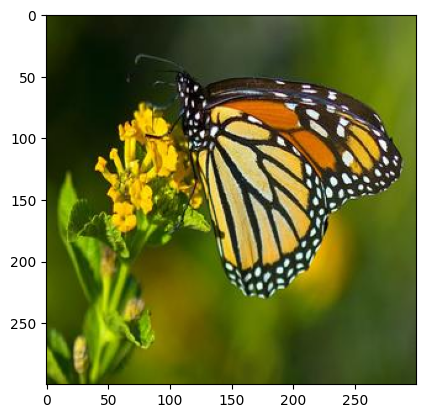




1/1 [==============================] - 0s 45ms/step
Actual Value: Positive
Predicted Value: Positive


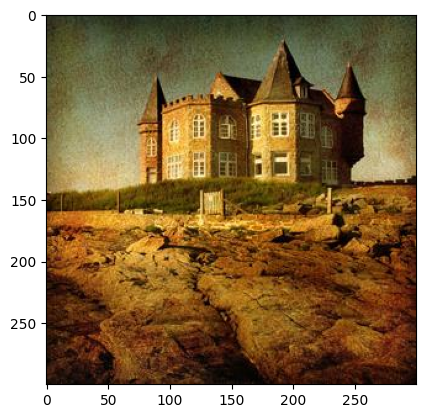




1/1 [==============================] - 0s 37ms/step
Actual Value : Negative
Predicted Value: Positive


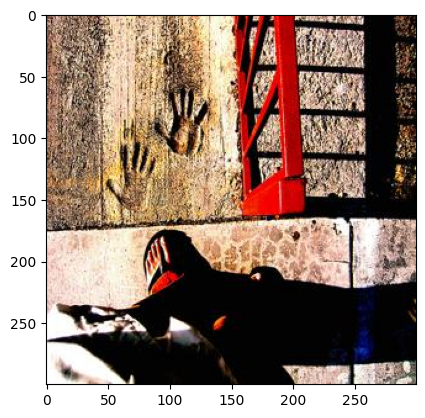




1/1 [==============================] - 0s 36ms/step
Actual Value: Positive
Predicted Value: Positive


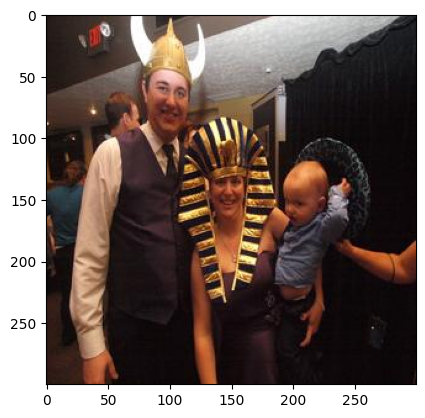




1/1 [==============================] - 0s 37ms/step
Actual Value: Positive
Predicted Value: Positive


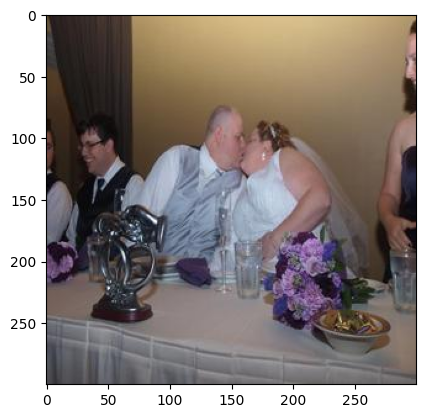




1/1 [==============================] - 0s 39ms/step
Actual Value: Positive
Predicted Value: Positive


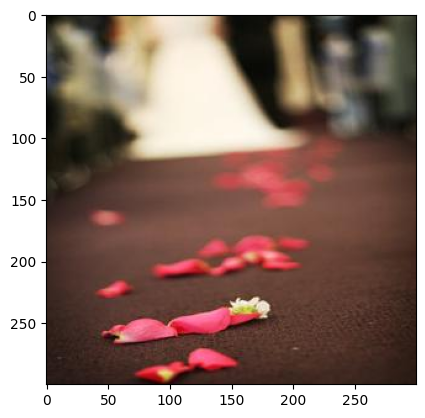




1/1 [==============================] - 0s 68ms/step
Actual Value: Positive
Predicted Value: Positive


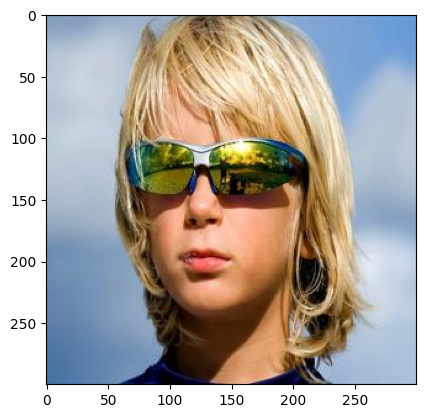




1/1 [==============================] - 0s 37ms/step
Actual Value: Positive
Predicted Value: Positive


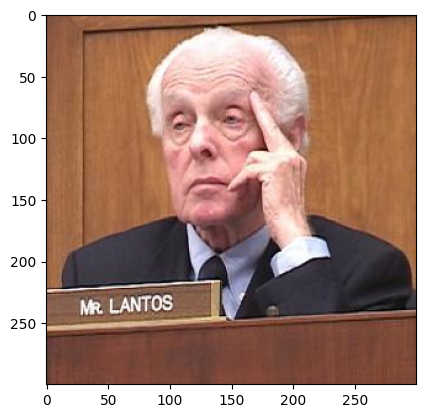




1/1 [==============================] - 0s 39ms/step
Actual Value: Positive
Predicted Value: Positive


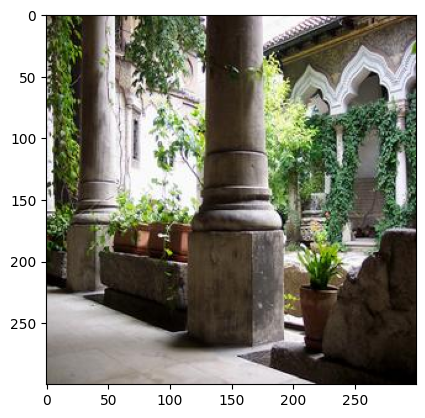




1/1 [==============================] - 0s 49ms/step
Actual Value: Positive
Predicted Value: Positive


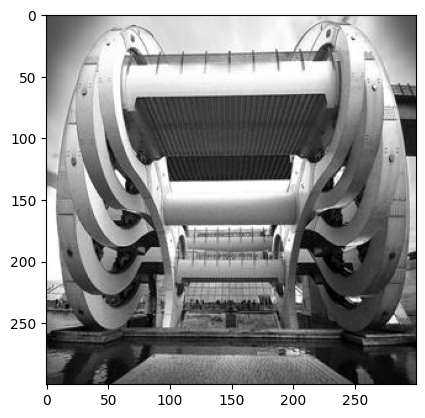




1/1 [==============================] - 0s 43ms/step
Actual Value: Positive
Predicted Value: Positive


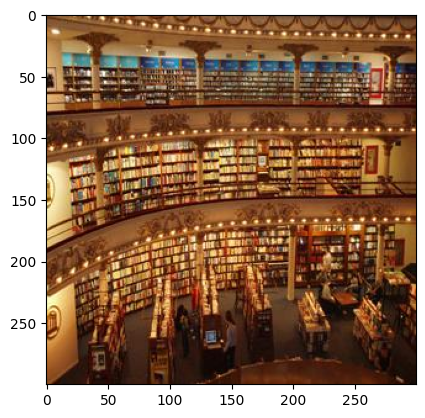




1/1 [==============================] - 0s 55ms/step
Actual Value: Positive
Predicted Value: Positive


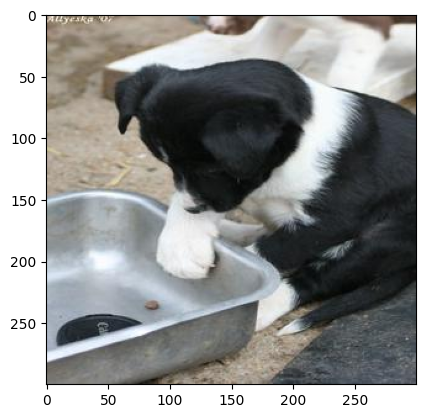




1/1 [==============================] - 0s 59ms/step
Actual Value : Negative
Predicted Value: Positive


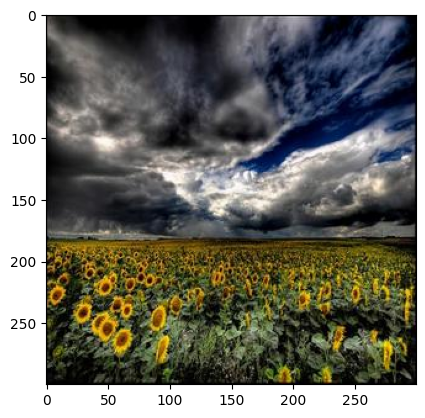




1/1 [==============================] - 0s 56ms/step
Actual Value : Negative
Predicted Value: Positive


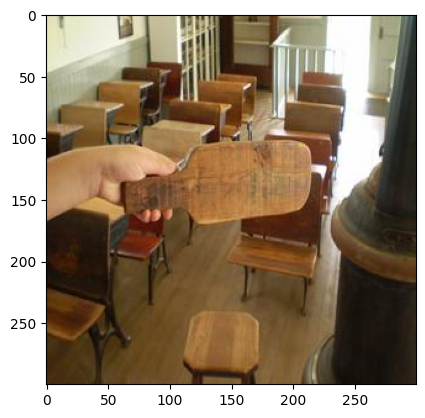




1/1 [==============================] - 0s 49ms/step
Actual Value: Positive
Predicted Value: Positive


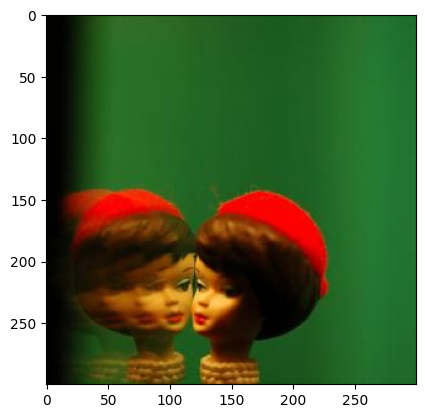




1/1 [==============================] - 0s 56ms/step
Actual Value : Negative
Predicted Value: Positive


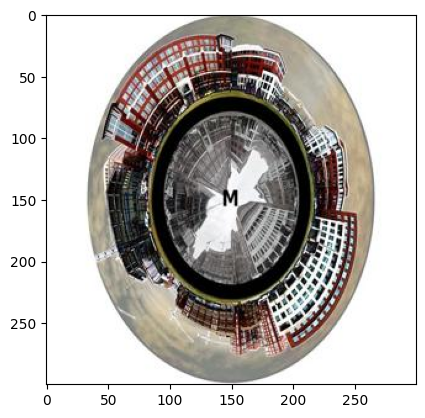




1/1 [==============================] - 0s 50ms/step
Actual Value : Negative
Predicted Value: Positive


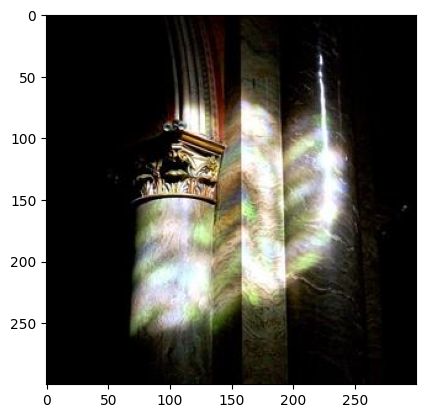




1/1 [==============================] - 0s 51ms/step
Actual Value: Positive
Predicted Value: Positive


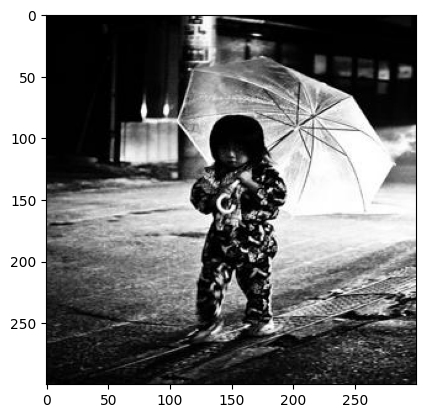




1/1 [==============================] - 0s 55ms/step
Actual Value: Positive
Predicted Value: Positive


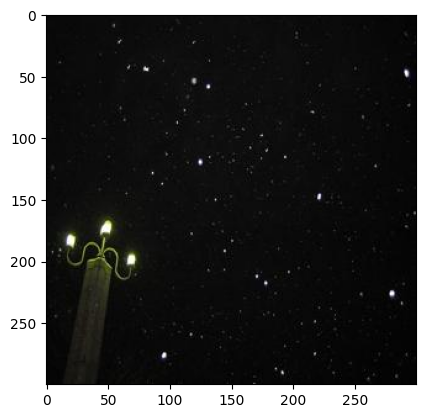




1/1 [==============================] - 0s 54ms/step
Actual Value: Positive
Predicted Value: Positive


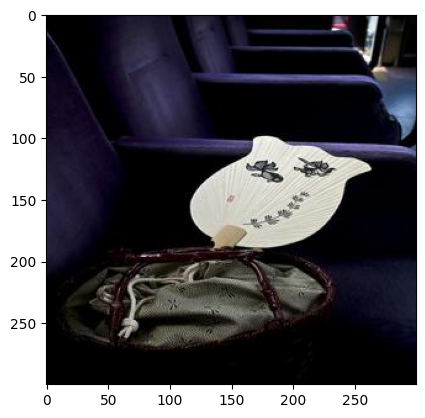




1/1 [==============================] - 0s 60ms/step
Actual Value: Positive
Predicted Value: Positive


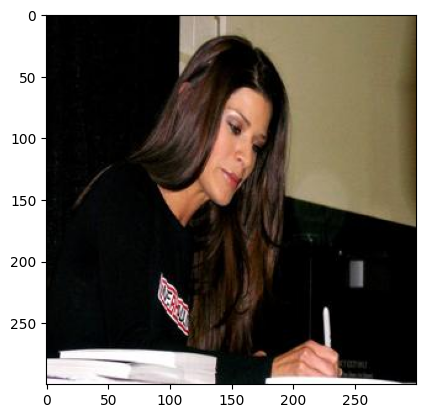




1/1 [==============================] - 0s 53ms/step
Actual Value : Negative
Predicted Value: Positive


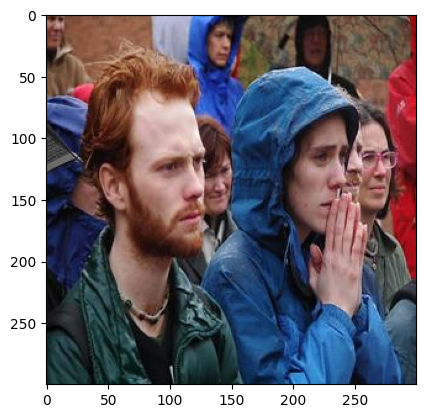




1/1 [==============================] - 0s 38ms/step
Actual Value: Positive
Predicted Value: Positive


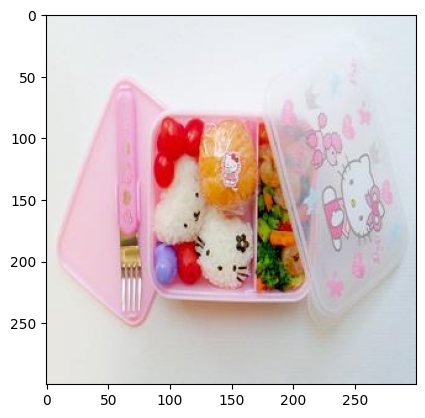

In [2]:

import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.utils import img_to_array
from keras.models import load_model

model = load_model('ImageSentimentAnalysis')

ground_truth = 'data.txt'
instanceList = []
List = []

gt_file = open(ground_truth, "r")

# Store images in a list
count = 0
while (True):
    line = gt_file.readline()
    # Check if we have reached the end 
    if (len(line) == 0 or count == 50):
        break
    # Add the line to the list
    instanceList.append(line)
    count+=1

for instance in instanceList:
  values = instance.split()
  
  image_path = 'D:/Image_sentiment_Analysis_arsh/color_image_resized/' + values[0]
  sentiment = int(values[1])

  im = Image.open(image_path)
  
  img1 = img_to_array(im)
  img_arr = img1.reshape(1,300,300,3)



  # prediction = model.predict_classes(img_arr)
  prediction = model.predict(img_arr)
  
  if(sentiment == 0):
    print('Actual Value : Negative')
  else:
    print('Actual Value: Positive')
  if(prediction == 0):
    print('Predicted Value : Negative')
  else:
    print('Predicted Value: Positive')

  plt.figure()
  plt.imshow(im)
  plt.show()
  print('\n\n')
